##### __PROGETTO DI ALESSANDRO GAZZILLO 06/2023:__
##### __TRACCIA__: 4 (Fetal Health Classification)  

<img src="dataset-cover.png" alt="Dataset-cover" width=90%>


---
---

1. Tutti i progetti dovranno essere accompagnati da una presentazione iniziale, utilizzando o google slides o powerpoint a piacimento(max 10 slides).
2. Progetto singolo
3. Scelta di una traccia
4. Notebook strutturato seguendo il procedimento comune richiesto

##### __PROCEDIMENTO COMUNE:__
Inizia analizzando il dataset e le relazioni tra le sue variabili, utilizzando le
tecniche di manipolazione e visualizzazione che hai appreso durante
master. Commenta le tue analisi in modo chiaro.
Una volta completata l’analisi esplorativa, imposta il problema di
predizione. Addestra e confronta uno o più modelli, indicando quello che ti
sembra migliore. Tra i modelli che utilizzerai, includi Random Forest e/o
XGBoost. Inoltre:

* per ogni modello, scegli con attenzione gli iperparametri che vuoi
validare, spiegandone il significato (almeno intuitivamente)
* giustifica la scelta della/delle metriche di valutazione che scegli di
adottare e analizza l’errore che commetti sul test set.
Una volta addestrati e testati i tuoi modelli, cerca di capire quali sono i
fattori che influiscono maggiormente sulla predizione finale. Anche in
questo caso, giustifica le scelte che fai.

##### __LINEE GUIDA PER LA PRESENTAZIONE:__
1. Presentazione del problema, dati a disposizione e obiettivi (1-2 slides)
2. EDA (2-3 slides)
3. Caratteristiche del modello o dei modelli progettati (2-3 slides)
4. Model evaluation e feature importance (2 slides)
5. Conclusioni, insights rilevanti e sviluppi futuri (2 slides)

---
---

##### __PUNTI DA SEGUIRE__:
0. **Definizione del problema** 
    Cosa voglio trovare e perché?

1. **Caricamento delle librerie**
    Caricamento delle librerie di Python e delle funzioni di jupyter notebook per automatizzare dei passaggi di codice.

2. **Ottenimento dei dati (KAGGLE)** 

3. **Controllo e pulizia dei dati** I dati vanno controllati: presenza di dati anomali, valori nulli, valori mancanti.

4. **EDA (Exploratory Data Analysis)** 
    Utilizzando tecniche di visualizzazione cerchiamo di capire la distribuzione dei dati e le loro relazioni (Correlation & Mutual information), eventualmente se presenti delle anomalie si ritorna al punto 3.
    Valutazione presenza di data leakage (dati che non sono presenti prima della predizione).

5. **Divisione in Train e Test**
    Rispettivamente 80% Train, 20% test.
    
6. **Scelta dei modelli e grid search & cross validation** 
    I modelli sono stati scelti già all'inizio e saranno 4 in tutto, SVM, Random Forest, XGBoost e KNN.
    Verifica di over o under fitting dei modelli tramite cross validation e ricerca degli iperparametri corretti con la grid search per l'ottimizzazione dei modelli.

7. **Addestramento dei modelli ottimizzati e valutazione sul test**
    Verranno valutate le performance dei modelli ottimizzati sulla parte di test con confusion matrix.

8. **Rimozione di alcune colonne e valutazione modelli**
    Verranno rimosse delle colonne che non sono rilevanti per l''addestramento dei modelli.'

9. **Scaliamo tutte le features e valutazione modelli**
    Verrà utilizzato il dataset a cui sono state rimosse le colonne non rilevanti riferite al punto precedente e verrà scalato tutto a valori compresi tra 0 e 1.

10. **Rimuoviamo la colonna UTERINE_CONTRACTIONS e valutazione modelli**
    Per rispondere alla domanda "Le contrazioni dell'utero sono rilevanti per comprendere la salute del feto?"
    rimuoviamo la colonna corrispondete e ritentiamo l'analisi e valutazione.
---
---

### 0. **Definizione del problema**

#### ___Fetal Health Classification___

lo scopo del compito è quello di predire e **classificare la salute dei feti** dalla 38a settimana di gestazione attraverso i dati ricavati **dal un esame cardiotocografico** della durata di mezzora; in tutto i feti possono essere **classificati come "Normali", "Sospetti" e "Patologici"**.

Il Dataset contiene **2126 registrazioni spalmate su 21 features**, queste features sono **tutte numeriche** e sono ricavate appunto da questo esame cardiotocografico che consiste nel posizionamento di due placche metalliche (che possono emettere e registrare ultrasuoni) sulla pancia della mamma e una pulsantiera nella mano, un placca misura principalmente il battico cardiaco del feto, l'altro misura le contrazioni dell'utero e la pulsantiera viene premuta dalla mamma quando percepisce dei movimenti dal feto.

Il Cardiotocografo stampa **2 istogrammi** che verranno poi analizzati per ricavare gli stessi dati utilizzati da questo Dataset.
Perché tutto questo, la **riduzione della mortalità infantile** è un indicatore **chiave del progresso umano**, la stragrande maggioranza dei decessi di bambini sotto i 5 anni di età si sono verificati in contesti con poche risorse e la maggior parte di questi potevano essere evitati, questo esame è poco costoso ed è accessibile a tutti, esso può predirre con una certa accuratezza la salute del feto.

    
#### __Citation__: 
* https://www.kaggle.com/datasets/andrewmvd/fetal-health-classification
* Ayres de Campos et al. (2000) SisPorto 2.0 A Program for Automated Analysis of Cardiotocograms. J Matern Fetal Med 5:311-318
https://onlinelibrary.wiley.com/doi/10.1002/1520-6661(200009/10)9:5%3C311::AID-MFM12%3E3.0.CO;2-9
* https://geekymedics.com/how-to-read-a-ctg/
* https://www.my-personaltrainer.it/salute/cardiotocografia.html

---
### 1. **Caricamento delle librerie**

In [1]:
import pandas as pd
pd.set_option('display.max_columns', 100)

rnd = 0

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedShuffleSplit, StratifiedKFold
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error, ConfusionMatrixDisplay, confusion_matrix, classification_report
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

from xgboost import XGBClassifier
from xgboost import plot_tree

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import numpy as np

---
### 2. **Ottenimento dei dati (KAGGLE)** 

In [2]:
#Salvataggio file csv all'interno della cartella di lavoro.
#Variabile in cui è presente il percorso del dataset scaricato
path_data = './fetal_health.csv'

--- 
### 3. **Controllo e pulizia dei dati**

In [3]:
#Caricamento e salvataggio dataset raw
df_original = pd.read_csv(path_data)

print('La dimensione del dataset è di {} righe e {} colonne'.format(df_original.shape[0], df_original.shape[1] ))

#Mostrate le prime 5 e le ultime 5 righe del dataset
display(df_original.head())
display(df_original.tail())

display(df_original.info())
display(df_original.describe())

La dimensione del dataset è di 2126 righe e 22 colonne


,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,2.4,64.0,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,10.4,130.0,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,13.4,130.0,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,23.0,117.0,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
2121,140.0,0.000,0.000,0.007,0.0,0.0,0.0,79.0,0.2,25.0,7.2,40.0,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0,2.0
2122,140.0,0.001,0.000,0.007,0.0,0.0,0.0,78.0,0.4,22.0,7.1,66.0,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2.0
2123,140.0,0.001,0.000,0.007,0.0,0.0,0.0,79.0,0.4,20.0,6.1,67.0,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2.0
2124,140.0,0.001,0.000,0.006,0.0,0.0,0.0,78.0,0.4,27.0,7.0,66.0,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2.0
2125,142.0,0.002,0.002,0.008,0.0,0.0,0.0,74.0,0.4,36.0,5.0,42.0,117.0,159.0,2.0,1.0,145.0,143.0,145.0,1.0,0.0,1.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

None

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.00000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.303857,0.003178,0.009481,0.004366,0.001889,0.000003,0.000159,46.990122,1.332785,9.84666,8.187629,70.445908,93.579492,164.025400,4.068203,0.323612,137.452023,134.610536,138.090310,18.808090,0.320320,1.304327
std,9.840844,0.003866,0.046666,0.002946,0.002960,0.000057,0.000590,17.192814,0.883241,18.39688,5.628247,38.955693,29.560212,17.944183,2.949386,0.706059,16.381289,15.593596,14.466589,28.977636,0.610829,0.614377
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.00000,0.000000,3.000000,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.00000,4.600000,37.000000,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.00000,7.400000,67.500000,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.00000,10.800000,100.000000,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.00000,50.700000,180.000000,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


**OSSERVAZIONI**:
* La prima colonna 'baseline value' contiene uno spazio puro e le altre colonne no (verrà sostituito da '_')
* Tutte le colonne contengono dei valori non nulli
* Tutte le colonne contengono dei valori numerici (float64)

In [4]:
#Preferenza personale, le colonne le voglio tutte in maiuscolo
df_original.columns = df_original.columns.str.upper()
#Sostituzione degli ' ' con '_' nei valori delle colonne
df_original.columns = df_original.columns.str.replace(' ', '_', regex=True,)

print('Valore della prima colonna dopo la sostituzione dello spazio: ', df_original.columns[0])

#Encode la colonna target con puri interi partendo da 0, questo perché XGBoostClassifier mi dà dei problemi sulle label del target
le_target = LabelEncoder().fit(df_original['FETAL_HEALTH'])
df_original['FETAL_HEALTH'] = le_target.transform(df_original['FETAL_HEALTH'])

#Trasformo i float in int
#df_original['FETAL_HEALTH'] = df_original['FETAL_HEALTH'].astype(int)

Valore della prima colonna dopo la sostituzione dello spazio:  BASELINE_VALUE


---
### 4. **EDA (Exploratory Data Analysis)** 

In [5]:
print('La lista completa delle features sono (compreso di target finale): \n', df_original.columns)

La lista completa delle features sono (compreso di target finale): 
 Index(['BASELINE_VALUE', 'ACCELERATIONS', 'FETAL_MOVEMENT',
       'UTERINE_CONTRACTIONS', 'LIGHT_DECELERATIONS', 'SEVERE_DECELERATIONS',
       'PROLONGUED_DECELERATIONS', 'ABNORMAL_SHORT_TERM_VARIABILITY',
       'MEAN_VALUE_OF_SHORT_TERM_VARIABILITY',
       'PERCENTAGE_OF_TIME_WITH_ABNORMAL_LONG_TERM_VARIABILITY',
       'MEAN_VALUE_OF_LONG_TERM_VARIABILITY', 'HISTOGRAM_WIDTH',
       'HISTOGRAM_MIN', 'HISTOGRAM_MAX', 'HISTOGRAM_NUMBER_OF_PEAKS',
       'HISTOGRAM_NUMBER_OF_ZEROES', 'HISTOGRAM_MODE', 'HISTOGRAM_MEAN',
       'HISTOGRAM_MEDIAN', 'HISTOGRAM_VARIANCE', 'HISTOGRAM_TENDENCY',
       'FETAL_HEALTH'],
      dtype='object')


* __Columns Description__:
    * **BASELINE_VALUE** : Baseline Fetal Heart Rate (FHR)
    * **ACCELERATIONS** : Number of accelerations per second
    * **FETAL_MOVEMENT** : Number of fetal movements per second
    * **UTERINE_CONTRACTIONS** : Number of uterine contractions per second
    * **LIGHT_DECELERATIONS** : Number of LDs per second
    * **SEVERE_DECELERATIONS** : Number of SDs per second
    * **PROLONGUED_DECELERATIONS** : Number of PDs per second
    * **ABNORMAL_SHORT_TERM_VARIABILITY** : Percentage of time with abnormal short term variability
    * **MEAN_VALUE_OF_SHORT_TERM_VARIABILITY** : Mean value of short term variability
    * **PERCENTAGE_OF_TIME_WITH_ABNORMAL_LONG_TERM_VARIABILITY** : Percentage of time with abnormal long term variability
    * **MEAN_VALUE_OF_LONG_TERM_VARIABILITY** : Mean value of long term variability
    * **HISTOGRAM_WIDTH** : Width of the histogram made using all values from a record
    * **HISTOGRAM_MIN** : Histogram minimum value
    * **HISTOGRAM_MAX** : Histogram maximum value
    * **HISTOGRAM_NUMBER_OF_PEAKS** : Number of peaks in the exam histogram
    * **HISTOGRAM_NUMBER_OF_ZEROES** : Number of zeroes in the exam histogram
    * **HISTOGRAM_MODE** : Hist mode
    * **HISTOGRAM_MEAN** : Hist mean
    * **HISTOGRAM_MEDIAN** : Hist Median
    * **HISTOGRAM_VARIANCE** : Hist variance
    * **HISTOGRAM_TENDENCY** : Histogram trend
    * **FETAL_HEALTH** : 
        * 1 - Normal 
        * 2 - Suspect 
        * 3 - Pathological

**OSSERVAZIONI**:
* Tutte le features, tranne il target 'FETAL_HEALTH', sono disponibili prima della predizione del target e quindi non è presente nessun data leakage.
* Tutte le features, tranne il target 'FETAL_HEALTH', sono ricavate sia per osservazione che per analisi statistica all'interno dell'istogramma creato durante la cardiotocografia.

<img src="schema 1.png" alt="Schema strumento" width=45%>
<img src="schema 2.png" alt="Schema strumento" width=45%>

Fonte immagini : https://www.youtube.com/watch?v=I5Dj9vKhlMQ&ab_channel=SarahXuereb

In [6]:
#Definita una palette di colori per identificare velocemente i 3 target all'interno dei vari grafici
custom_palette = {0 : 'tab:green', 1 : 'tab:orange', 2 : 'tab:red'}

Text(0.5, 1.0, 'CONTEGGIO TIPOLOGIE FETAL_HEALTH')

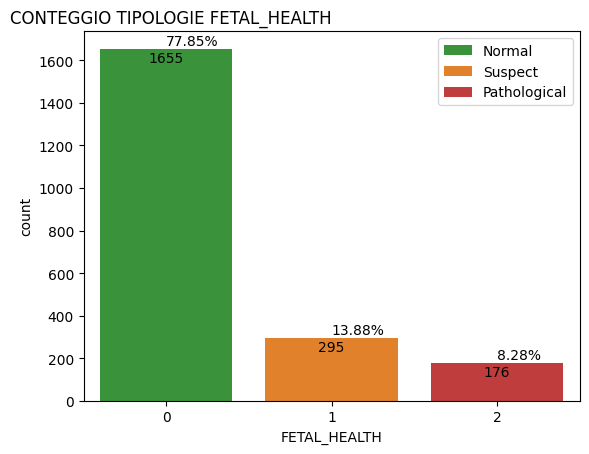

In [7]:
#Conto i valori unici della colonna target FETAL_HEALTH
count_FE = df_original['FETAL_HEALTH'].value_counts().values
#e qua trasformo la lista in percentuale
perc_FE = df_original['FETAL_HEALTH'].value_counts(normalize = True).values*100
perc_FE = perc_FE.round(2)  #arrotondo a 2 cifre dopo la virgola

#Countplot del target
plot_1 = sns.countplot(x = 'FETAL_HEALTH', hue = 'FETAL_HEALTH', data = df_original, dodge = False, palette = custom_palette)

#Legenda custom
plot_1.legend(['Normal', 'Suspect', 'Pathological'])

#Aggiunta della percentuale in cima alle barre
for i, v in enumerate(perc_FE):
    plot_1.text(i, count_FE.tolist()[i] + 5, str(v) + '%', ha='left', va='bottom', fontsize=10) 

#Aggiunta del valore corrispondente alle barre sotto la percentuale
for i, v in enumerate(count_FE):
    plot_1.text(i, v -10 , str(v), ha = 'center', va = 'top', fontsize = 10)


plt.title('CONTEGGIO TIPOLOGIE FETAL_HEALTH', ha = 'right')

**OSSERVAZIONI**:
* Attenzione alle label del target, per evitare problemi con XGBoost le ho dovute impostare così come si vede nel custom_palette in alto.
* Il **Dataset è sbilanciato**, le priorità sono l'individuare i **Pathological** (l'**8.28%** dell'intero Dataset) e i **Suspect** (l'**13.88%** dell'intero Dataset) il restante è **Normal**.


Text(0.5, 1.0, 'PAIRPLOT FETAL_HEALTH')

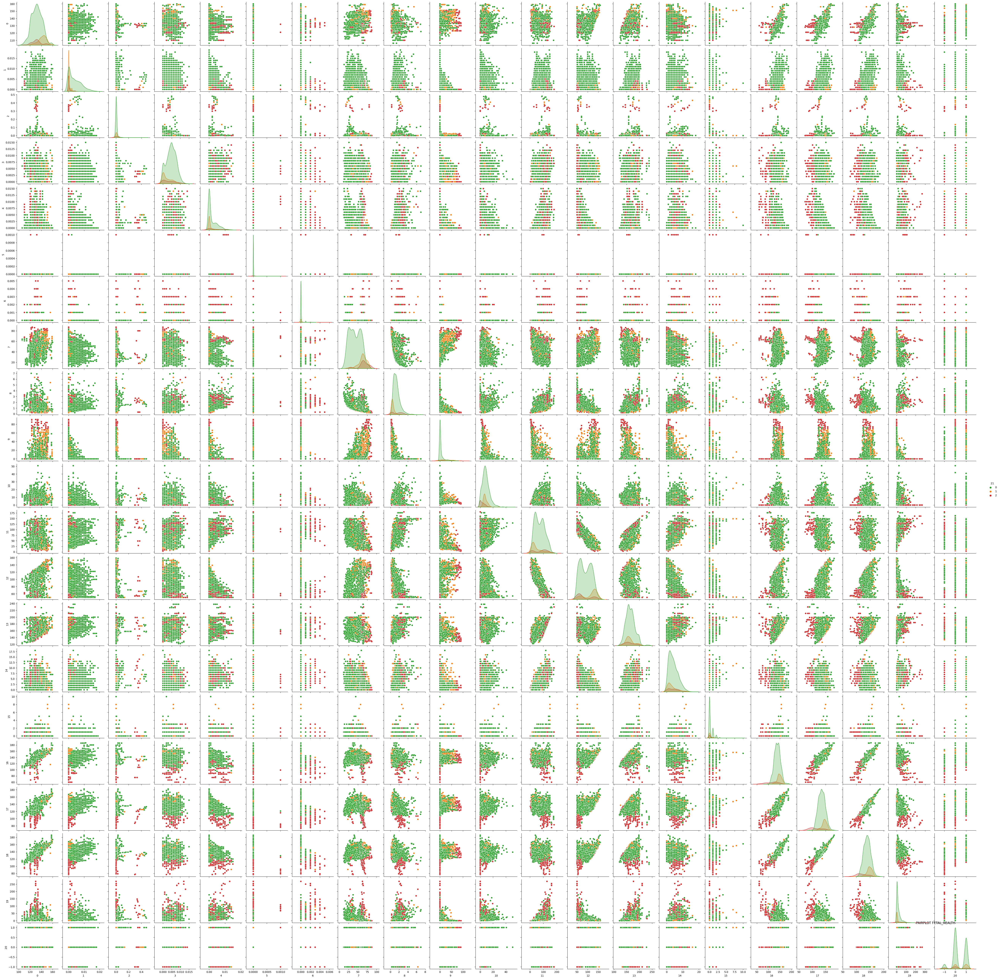

In [8]:
#Lo scopo di questo blocco di codice è avere una overview di tutte le features, ponderate dal target con il parametro 'hue', con tutte le possibili combinazioni a coppie.
#Per evitare problemi di overlap dei nomi delle features verranno sostituiti con l'indice della colonna.

df_custom_1 = df_original.copy()
#sostituzione delle colonne con gli indici.
df_custom_1.columns = range(0, df_custom_1.shape[1])

#pairplot generale
plot_2 = sns.pairplot(df_custom_1, hue = 21, palette = custom_palette)

plt.title('PAIRPLOT FETAL_HEALTH', ha = 'right')

**OSSERVAZIONI**:
* Nel pairplot è possibile notare dei **cluster rossi** (**Pathological**) e qualche accenno dei gialli, si possono notare anche delle **correlazioni lineari** tra features direttamente connesse da ragionamenti statistici come la media, moda e mediana e anche la baseline_value (che per definizione è una media del battito cardiaco). Può darsi che il modello **KNN** funzioni bene con il dataset.

Text(0.5, 1.0, 'Heat Map Correlazioni linerari')

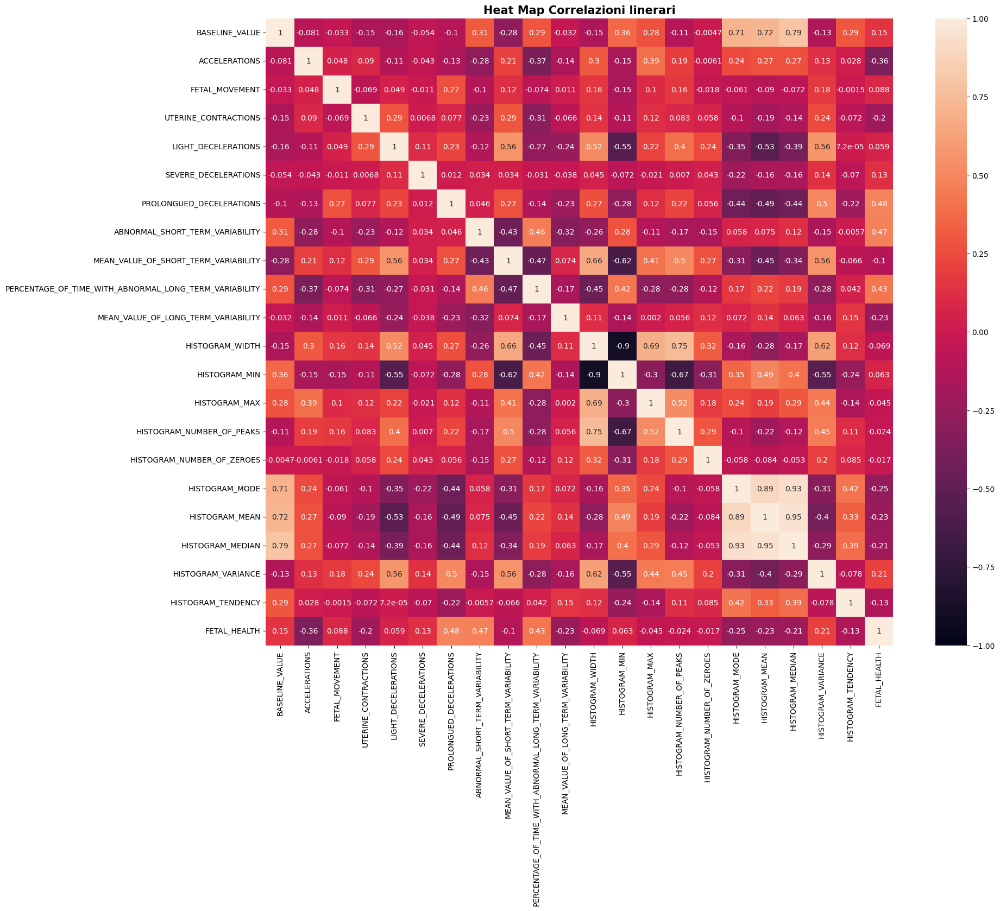

In [9]:
#Mappa di calore di tutte le correlazioni linerari tra le features
plt.subplots(figsize=(20,15))
plt_3 = sns.heatmap(data = df_original.corr(), vmin= -1, annot=True, square = True)
plt_3.set_title('Heat Map Correlazioni linerari', fontdict={'size': 15,'weight': 'bold'})
#plt.rcParams.update({'font.size': 22})

##### Sovrapposizione del pairplot e della heatmap.

<img src="heat_plus_plots.png" alt="pairplot plus heat" width=80%>

**OSSERVAZIONI**:
* Si possono notare anche nei grafici delle features con quantità discrete di indice: 3, 4, 5, 6 e 15 (verifica)

In [10]:
#Verifica se le colonne di indice [3, 4, 5, 6, 15] hanno elementi discreti, 
#quindi unici, quindi dovremo avere degli elementi unici che si ripetono e sono contenuti con una certa quantità

#lista delle colonne interessate partendo dagli indici
discrete_columns = df_original.iloc[:,[3, 4, 5, 6, 15]].columns

print('Le colonne con quantità discrete sono:', discrete_columns)

#Voglio creare un dataset che mostri un overview dei conteggi
dict_discrete_value_counts = {}

for column in df_original[discrete_columns]:
    dict_discrete_value_counts[column] = df_original[column].value_counts()

df_discrete_value_counts = pd.DataFrame(dict_discrete_value_counts)
df_discrete_value_counts.index.name = 'unique value'

df_discrete_value_counts

Le colonne con quantità discrete sono: Index(['UTERINE_CONTRACTIONS', 'LIGHT_DECELERATIONS', 'SEVERE_DECELERATIONS',
       'PROLONGUED_DECELERATIONS', 'HISTOGRAM_NUMBER_OF_ZEROES'],
      dtype='object')


,UTERINE_CONTRACTIONS,LIGHT_DECELERATIONS,SEVERE_DECELERATIONS,PROLONGUED_DECELERATIONS,HISTOGRAM_NUMBER_OF_ZEROES
unique value,,,,,
0.000,332.0,1231.0,2119.0,1948.0,1624.0
0.001,118.0,163.0,7.0,70.0,NaN
0.002,160.0,115.0,NaN,72.0,NaN
0.003,212.0,118.0,NaN,24.0,NaN
0.004,244.0,114.0,NaN,9.0,NaN
0.005,290.0,107.0,NaN,3.0,NaN
0.006,231.0,74.0,NaN,NaN,NaN
0.007,216.0,54.0,NaN,NaN,NaN
0.008,160.0,55.0,NaN,NaN,NaN


**OSSERVAZIONI**:
* Dopo questa analisi potrei considerare di **eliminare la colonna 'SEVERE DECELERATIONS'** in quanto contiene per lo più zeri e 7 valori,
per le altre colonne ancora non saprei.
* Passo successivo sarebbe scalare le features delle colonne **UTERINE_CONTRACTIONS**, **LIGHT_DECELERATIONS** e **PROLONGUED_DECELERATIONS** Però prima voglio verificare il primo ciclo di gridsearchCV. Avrebbe più senso scalare tutte le features.
* Ma le contrazioni dell'utero sono rilevanti per comprendere se un feto è sano oppure patologico?

---
### 5. **Divisione in Train e Test** 

In [11]:
#Creazione delle variabili X senza target e y solo target
X = df_original.drop('FETAL_HEALTH', axis = 1)
y = df_original['FETAL_HEALTH'].astype(int)

#Check dimensioni
print('Dimensione del Dataset raw:', df_original.shape)
print('Dimensione di X:', X.shape)
print('Dimensione di y:', y.shape)

#Divisione tramite stratified
splitter = StratifiedShuffleSplit(random_state=rnd, test_size=0.2, n_splits=1)

train_full_idx, test_idx = next(splitter.split(X, y))

X_train_full = X.iloc[train_full_idx]
y_train_full = y.iloc[train_full_idx]

X_test = X.iloc[test_idx]
y_test = y.iloc[test_idx]

#Check dimensioni
print('Dimensione del Dataset X_train_full:', X_train_full.shape)
print('Dimensione del Dataset y_train_full:', y_train_full.shape)
print('Dimensione del Dataset X_test:', X_test.shape)
print('Dimensione del Dataset y_test:', y_test.shape)


'''
#nuovo splitter per creare il train per il validation test
splitter_2 = StratifiedShuffleSplit(random_state=rnd, test_size=0.2, n_splits=1)

train_idx, test_valid_idx = next(splitter_2.split(X_train_full, y_train_full))

X_train= X_train_full.iloc[train_idx]
y_train = y_train_full.iloc[train_idx]

X_test_valid = X_train_full.iloc[test_valid_idx]
y_test_valid = y_train_full.iloc[test_valid_idx]

#Check dimensioni
print('Dimensione del Dataset X_train:', X_train.shape)
print('Dimensione del Dataset y_train:', y_train.shape)
print('Dimensione del Dataset X_test_valid:', X_test_valid.shape)
print('Dimensione del Dataset y_test_valid:', y_test_valid.shape)
'''

Dimensione del Dataset raw: (2126, 22)
Dimensione di X: (2126, 21)
Dimensione di y: (2126,)
Dimensione del Dataset X_train_full: (1700, 21)
Dimensione del Dataset y_train_full: (1700,)
Dimensione del Dataset X_test: (426, 21)
Dimensione del Dataset y_test: (426,)


"\n#nuovo splitter per creare il train per il validation test\nsplitter_2 = StratifiedShuffleSplit(random_state=rnd, test_size=0.2, n_splits=1)\n\ntrain_idx, test_valid_idx = next(splitter_2.split(X_train_full, y_train_full))\n\nX_train= X_train_full.iloc[train_idx]\ny_train = y_train_full.iloc[train_idx]\n\nX_test_valid = X_train_full.iloc[test_valid_idx]\ny_test_valid = y_train_full.iloc[test_valid_idx]\n\n#Check dimensioni\nprint('Dimensione del Dataset X_train:', X_train.shape)\nprint('Dimensione del Dataset y_train:', y_train.shape)\nprint('Dimensione del Dataset X_test_valid:', X_test_valid.shape)\nprint('Dimensione del Dataset y_test_valid:', y_test_valid.shape)\n"

---
### 6. **Scelta dei modelli e grid search & cross validation** 

* __Modelli scelti__:
    * __Random forests__. come da traccia.
    * __K-nearest neighbors (KNN)__. KNN potrebbe funzionare bene perché durante la EDA è possibile notare dei cluster pesati dalle classi target.
    * __XGBoost__: come da traccia.
    * __Support vector machines (SVM)__. ricerca di un iperpiano tra le features per la separazione in classi, il dataset non è grande e quindi potrebbe ferformare bene.

    N.P. dovremo scalare delle feature per far funzionare meglio SVM e KNN ma per ora verrà anallizzato tutto senza modificare le features.


In [12]:
#Voglio creare una funzione che automatizzi l'analisi di grid search e cross validation, 
#che mi restituisca un grafico per ogni modello valutato visualizzando lo score per ogni lista di iper parametri testati
#e alla fine mi resistuisca una lista con i risultati di ogni modello e un printaggio di una overview di tutti i miglior iper parametri trovati per ogni modello analizzato.


def grid_search_cross_validation(models, params, X_train, y_train):

    '''
    models = lista di modelli di machine learning
    params = lista di dizionari di iper parametri corrispondenti in ordine alla lista dei models
    x_train 
    y_train 
     
    '''
    
    #salverò i risultati della funzione GridSearchCV all'interno di questa lista
    results = []

    #Salverò i riassunti di ogni GridSearchCV del modello in questa lista
    overview = []

    for model, param_grid in zip(models, params):
        
        #----------ANALISI----------#

        grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1, verbose = 0)
        grid_search.fit(X_train, y_train)

        #salvataggio dei risultati
        cv_results = grid_search.cv_results_
        results.append(cv_results)

        #variabili utili per i passi successivi 
        scores = cv_results['mean_test_score']
        model_name = model.__class__.__name__,
        param_labels = [int(i) for i in range(len(scores))]  
        

        #----------GRAFICI----------#

        plt.figure(figsize=(16, 4))
        sns.lineplot(x=param_labels, y=scores, marker='o', label=model_name)

        #modifiche speciali del grafico
        ax = plt.gca()
        ax.xaxis.set_ticks([x for x in range(len(scores))])
        ax.set_xticklabels( [cv_results['params'][x] for x in range(len(scores))] , rotation = 90, fontsize=10)
        #vengono mostrate le griglie nel background del grafico per una facile lettura
        plt.grid(axis = 'both', linestyle = '--', linewidth = 0.5)
        plt.ylabel('Score')
        plt.title('Grid Search Cross-Validation of {}'.format(model_name))
        plt.legend()
        plt.show()

        #----------OVERVIEW----------#

        #salvataggio nella lista overview definita all'inizio della funzione della segunte conclusione in formato string
        overview.append(('\nI migliori iper-parametri individuati del modello {} sono: {}, con un best score di: {}'.format(model_name, grid_search.best_params_, grid_search.best_score_ )))

    for i in overview:
        print(i, '\n')

    return results


* RandomForestClassifier: 
    * -n_estimators: sarebbe la quantità di decision trees creati nel modello, vorrei usarne come minimo 100 fino a un massimo di 1300 a passi di 200 alberi, più alberi sono e più diventano precise le decisioni finali.

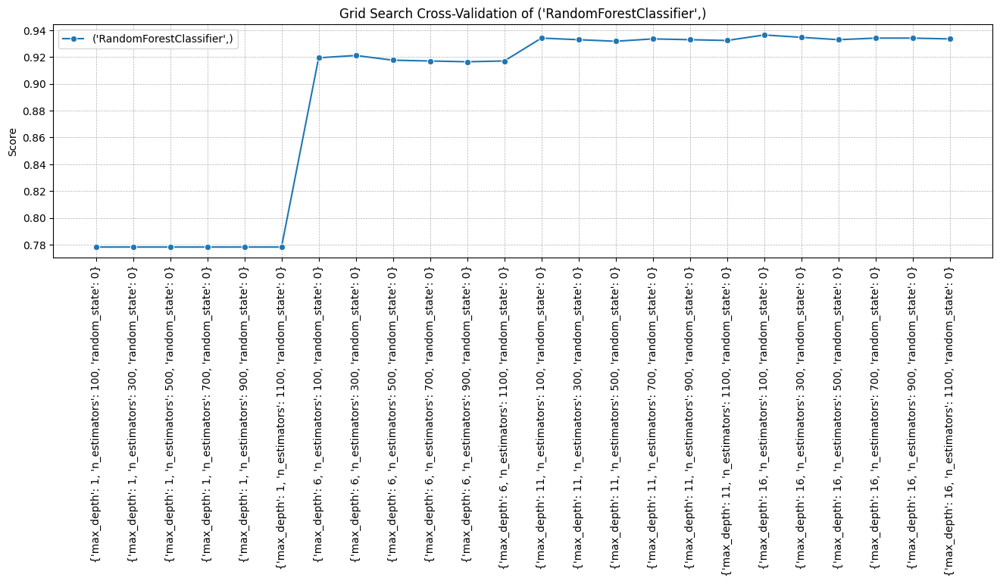

C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\neighbors\_classification.py", line 213, in fit
    self._validate_params()
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 600, in _validate_params

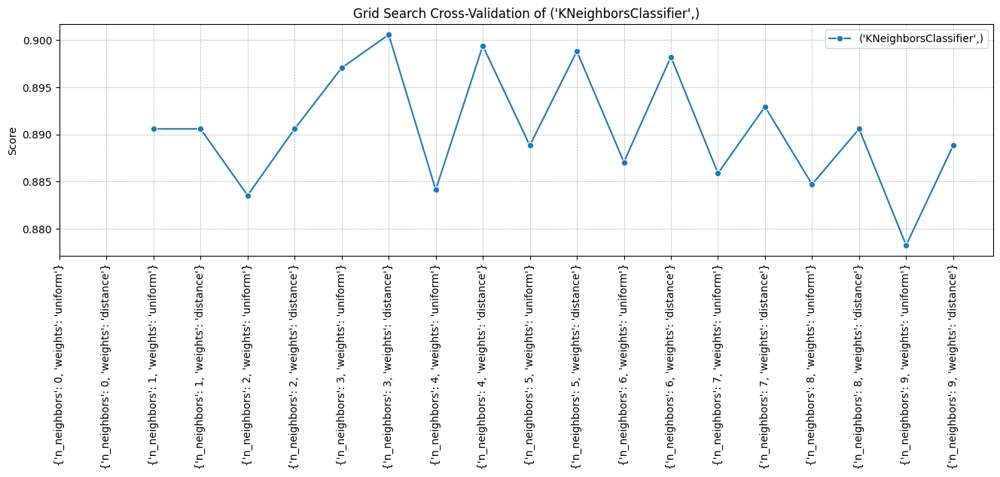

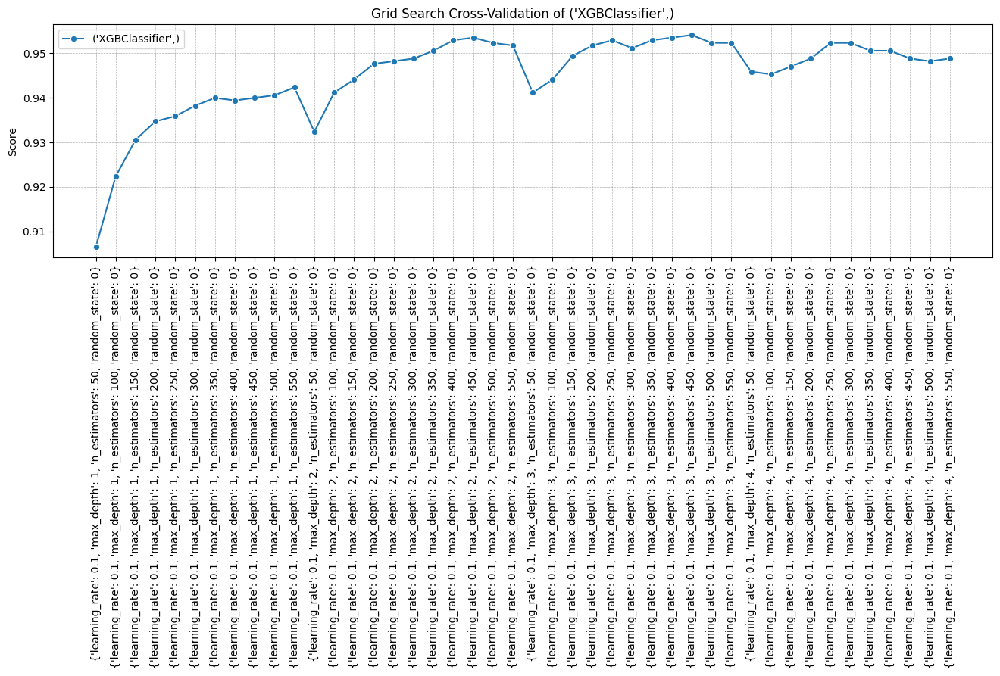

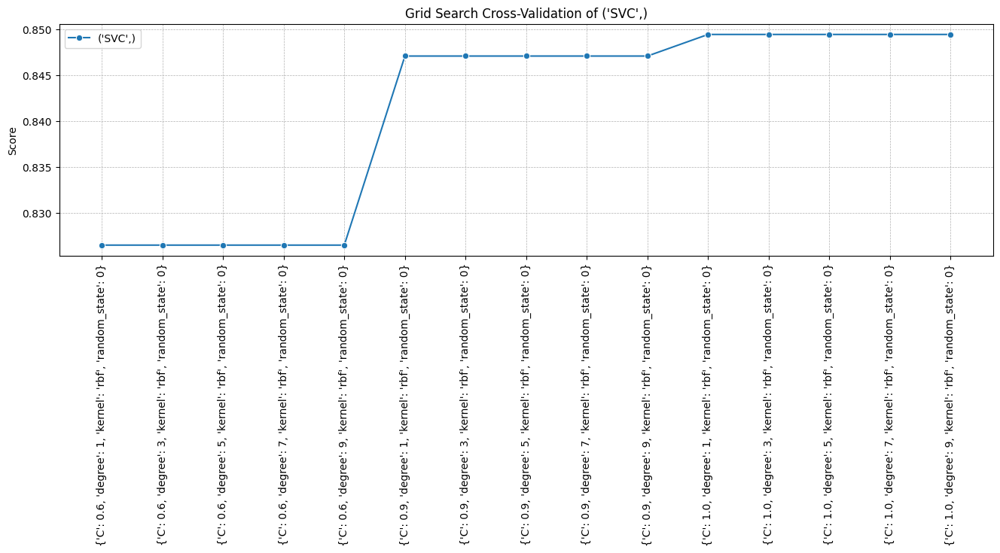


I migliori iper-parametri individuati del modello ('RandomForestClassifier',) sono: {'max_depth': 16, 'n_estimators': 100, 'random_state': 0}, con un best score di: 0.9364705882352942 


I migliori iper-parametri individuati del modello ('KNeighborsClassifier',) sono: {'n_neighbors': 3, 'weights': 'distance'}, con un best score di: 0.9005882352941177 


I migliori iper-parametri individuati del modello ('XGBClassifier',) sono: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 450, 'random_state': 0}, con un best score di: 0.9541176470588235 


I migliori iper-parametri individuati del modello ('SVC',) sono: {'C': 1.0, 'degree': 1, 'kernel': 'rbf', 'random_state': 0}, con un best score di: 0.8494117647058823 



In [13]:
#Lista dei modelli da applicare nella funzione definita nel blocco di codice precedente
models = [RandomForestClassifier(), 
          KNeighborsClassifier(), 
          XGBClassifier(), 
          SVC()]

#Iper-parametri sforbiciati dopo il primo ciclo di analisi, ne avevo messi troppi da analizzare e di conseguenza allungava i tempi di calcolo, 
#notando che molti di questi erano inefficienti (restituendo uno score basso), li ho rimossi.

params = [{'n_estimators' : [i for i in range(100, 1300, 200)], 'max_depth' : [i for i in range(1, 20, 5)], 'random_state' : [rnd]},
          {'n_neighbors': [i for i in range(0,10,1)], 'weights': ['uniform', 'distance']},
          {'max_depth': range (1, 5, 1),'n_estimators': range(50, 600, 50),'learning_rate': [0.1], 'random_state' : [rnd]},
          {'C' : [0.60, 0.90, 1.00], 'kernel' : ['rbf'], 'random_state' : [rnd], 'degree' : [i for i in range(1 ,10 ,2)]}]

#Richiamo della funzione
analisi_v0 = grid_search_cross_validation(models, params, X_train_full, y_train_full)


**OSSERVAZIONI**:
* **SVC** purtroppo non performa molto bene (85% di accuratezza), probabilmente le features sono da elaborare meglio per questo modello
* **KNN** come era previsto, performa bene (90% di accuratezza) nonostate le features non sono state elaborate a fondo.
* **RandomForestClassifier** performa meglio di KNN (93.6% di accuratezza) e qui non è necessaria una elaborazione delle features.
* **XGBClassifier** ancora meglio di RandomForestClassifier (95% di accuratezza) chissà come può performare dopo aver elaborato meglio le features.

---
### 7. **Addestramento dei modelli ottimizzati e valutazione sul test** 

In [14]:
#Questa è una funzione che automatizza la fase di fitting, testing e analisi dei risultati con confusion matrix

def test_model(models ,X_train , y_train, X_test, y_test):
    '''
    models = lista dei modelli con iperparametri inseriti
    x_train, y_train, X_test, y_test

    '''
    #voglio ritornare alla fine della funzione questa lista che conterrà i modelli addestrati, 
    #alcuni modelli tengono in memoria le Feature Importance, cosa che mi servirà dopo
    model_fitted_list = []

    #per ogni modello nella lista data
    for model in models:

        #salvataggio del nome del modello in una variabile
        nome_modello = model.__class__.__name__
        #addestramento modello
        model_fitted = model.fit(X_train, y_train)

        model_fitted_list.append(model_fitted)
        print('\t\tCLASSIFICATIION METRICS "{}":\n'.format(nome_modello))
        print(classification_report(y_test, model.predict(X_test),
        target_names = ['Normal', 'Suspect', 'Pathological']))

        # Eseguire le previsioni sul test set
        y_pred = model_fitted.predict(X_test)

        # Calcolo della matrice di confusione
        conf_matrix = confusion_matrix(y_test, y_pred, labels = model.classes_)

        # Creazione del confusion plot
        disp = ConfusionMatrixDisplay(confusion_matrix = conf_matrix, display_labels = model.classes_)
        disp.plot()
        plt.title('Confusion Matrix of {}'.format(nome_modello))
    
    return model_fitted_list
        

		CLASSIFICATIION METRICS "RandomForestClassifier":

              precision    recall  f1-score   support

      Normal       0.97      0.98      0.98       332
     Suspect       0.88      0.86      0.87        59
Pathological       1.00      0.86      0.92        35

    accuracy                           0.96       426
   macro avg       0.95      0.90      0.92       426
weighted avg       0.96      0.96      0.96       426

		CLASSIFICATIION METRICS "KNeighborsClassifier":

              precision    recall  f1-score   support

      Normal       0.96      0.97      0.96       332
     Suspect       0.79      0.78      0.79        59
Pathological       0.94      0.86      0.90        35

    accuracy                           0.93       426
   macro avg       0.90      0.87      0.88       426
weighted avg       0.93      0.93      0.93       426

		CLASSIFICATIION METRICS "XGBClassifier":

              precision    recall  f1-score   support

      Normal       0.97      0.99  

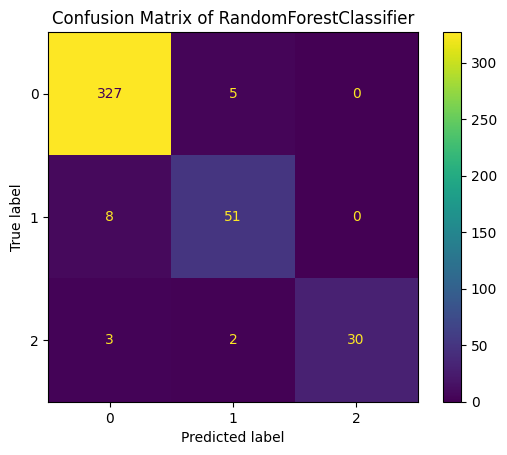

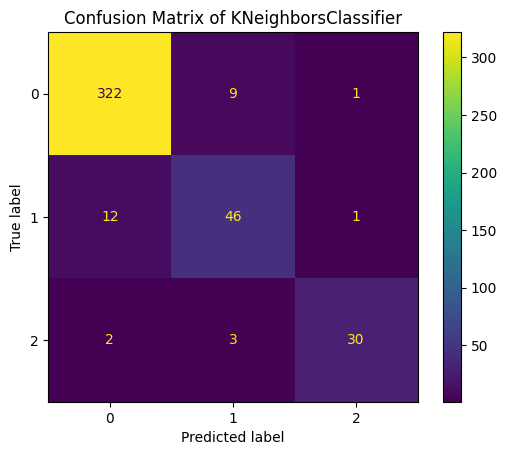

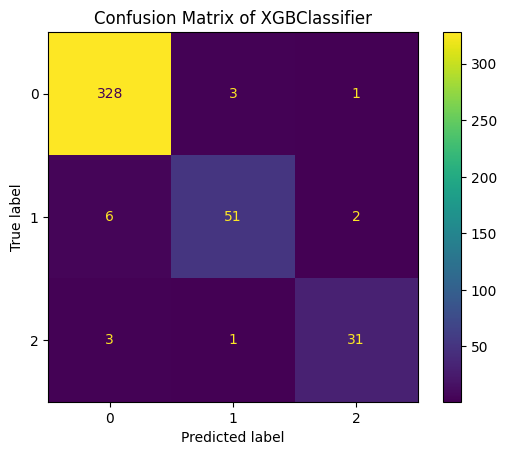

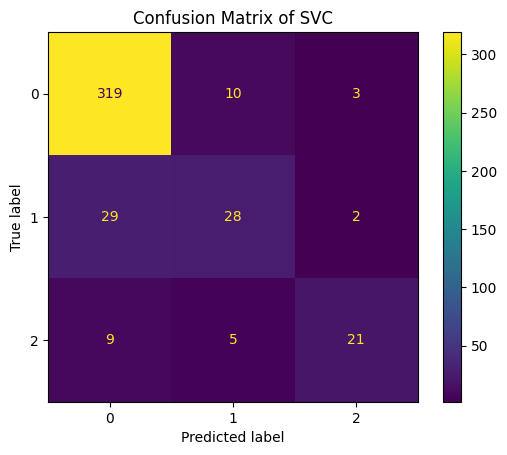

In [15]:
#Lista di modelli ottimizzati dal primo giro di GridSearchCV
model_opt = [
    RandomForestClassifier(max_depth =  16, n_estimators =  100, random_state = rnd, n_jobs = -1),
    KNeighborsClassifier(n_neighbors = 3, weights = 'distance'),
    XGBClassifier(learning_rate = 0.1, max_depth = 3, n_estimators = 450, random_state = rnd, n_jobs = -1),
    SVC(C = 1.0, degree = 1, kernel = 'rbf', random_state = rnd)
]

#richiamo della funzione definita nel blocco di codice precedente
model_fitted_list_v0 = test_model(model_opt, X_train_full, y_train_full, X_test, y_test)


##FUFFA
#model_1 = RandomForestRegressor(max_depth =  16, n_estimators =  100, random_state = rnd, n_jobs = -1)
#model_2 = KNeighborsClassifier(n_neighbors = 3, weights = 'distance')
#model_3 = XGBClassifier(learning_rate = 0.1, max_depth = 3, n_estimators = 450, random_state = rnd,)
#model_4 = SVC(C = 1.0, degree = 1, kernel = 'rbf', random_state = rnd)

#model_1.fit(X_train_full, y_train_full)
#y_predict_1 = model_1.predict(X_test)

#print(classification_report(y_test, y_predict_1))

#y_predict_1.tolist()

**OSSERVAZIONI**:
* Il confusion matrix di RandomForestClassifier ha un f1 score alto per tutte e 3 le classi, è un peccato che alla fine 3 feti patologici li ha considerati sani (però almeno 2 li ha considerati patologici) e 8 feti sospetti sono stati considerati sani.
* Il KNN performa meno bene di RandomForestClassifier sui sospetti, ma nonostante la sua semplcitià, il basso numero di rows e il dataset estremamente sbilanciato funziona con una certa precisione. Comunque non sono accettabili così tanti falsi sani su dei feti sospetti, ma trovo molto utile che almeno 3 patologici li ha insieriti almeno nei sospetti così che possano essere individuati.
* XGBClassifier funziona bene con i feti sani ma sui sospetti poco meno e non mi piace che 3 feti patologici li considera sani...
* SVC purtroppo come previsto non funziona bene

Text(0.5, 1.0, 'Features Importance of RandomForestClassifier')

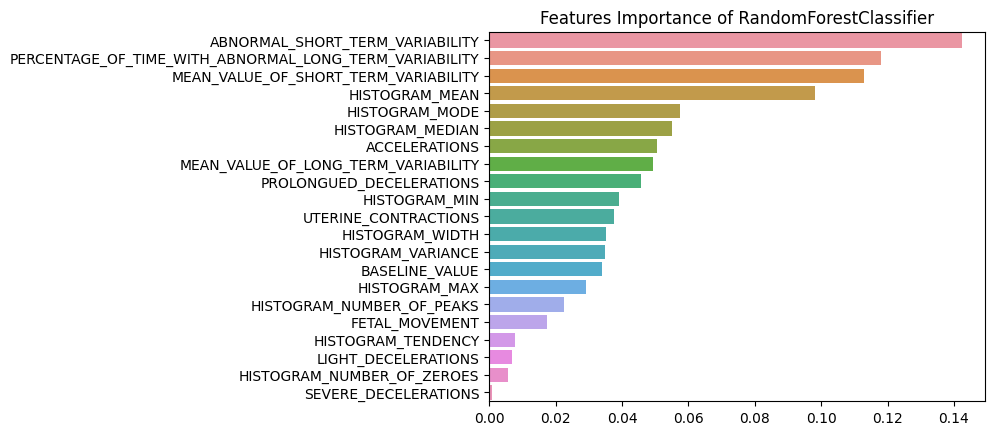

In [16]:
#ricavolo i modelli fittati con gli iperparametri ottimizzati che contengono delle info sul features importance
model_fitted_list_v0[0].feature_importances_
#il [::-1] serve per girare l'array in modo tale che sia decrescente
sorted_idx = model_fitted_list_v0[0].feature_importances_.argsort()[::-1]

#Plotto un barplot veloce con sns 
sns.barplot(x = model_fitted_list_v0[0].feature_importances_[sorted_idx], y = X_train_full.columns[sorted_idx])
plt.title('Features Importance of RandomForestClassifier')

Text(0.5, 1.0, 'Features Importance of XGBClassifier')

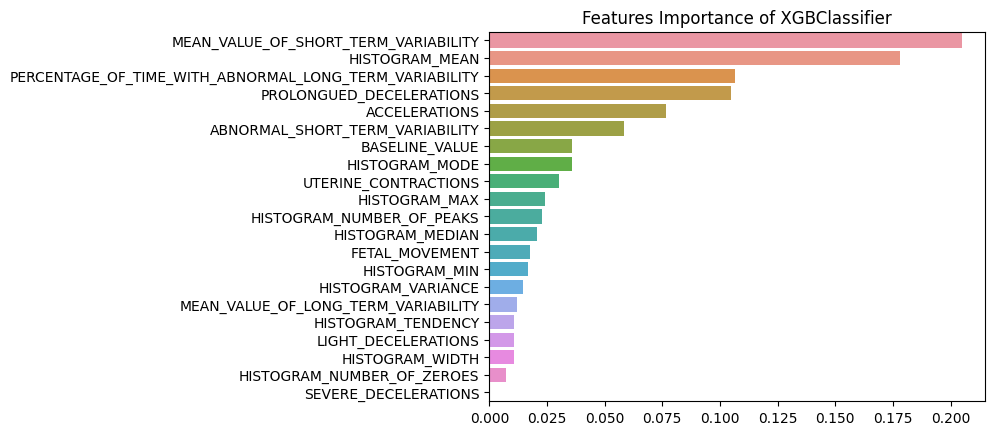

In [17]:
#ricavolo i modelli fittati con gli iperparametri ottimizzati che contengono delle info sul features importance
model_fitted_list_v0[2].feature_importances_
#il [::-1] serve per girare l'array in modo tale che sia decrescente
sorted_idx = model_fitted_list_v0[2].feature_importances_.argsort()[::-1]

#Plotto un barplot veloce con sns 
sns.barplot(x = model_fitted_list_v0[2].feature_importances_[sorted_idx], y = X_train_full.columns[sorted_idx])
plt.title('Features Importance of XGBClassifier')

**OSSERVAZIONI**:
* UTERINE_CONTRACTIONS ha una media importanza sia in RandomForest che XGBoost, quindi può essere importante come può essere un elemento che può inquinare l'accuratezza del modello, si potrebbe eliminare solo lei successivamente per verificare la variazione di accuratezza dei modelli.

* Cosa potrebbe succedere se normalizzo tutte le features? I modelli aumentano o diminuiscono di accuratezza? Sicuramente KNN può solo che guadagnarci.

* Delle colonne con valori discreti segnalate all'inizio ('UTERINE_CONTRACTIONS', 'LIGHT_DECELERATIONS', 'SEVERE_DECELERATIONS', 'PROLONGUED_DECELERATIONS', 'HISTOGRAM_NUMBER_OF_ZEROES')
SEVERE_DECELERATIONS è confermata doppiamente come feature poco utile ai modelli
HISTOGRAM_NUMBER_OF_ZEROES è confermata doppiamente come feature poco utile ai modelli,LIGHT_DECELERATIONS è doppiamente poco utile ai modelli.

---
#### I prossimi passaggi sono l'applicazione pratica delle osservazioni fatte fino adesso.



---
### 8. Rimozione di alcune colonne e rivalutazione modelli
Verranno rimosse le seguenti colonne dal dataframe 'SEVERE_DECELERATIONS' 'PROLONGUED_DECELERATIONS', 'HISTOGRAM_NUMBER_OF_ZEROES' e rivalutato il tutto con la funzione grid_search_cross_validation e testati i modelli nuovamente.

In [18]:
#Copio i train e i test in nuove variabili
#così da applicare questi cambiamenti solo a quest'ultime e non a quelle dei passaggi precedenti.

X_train_full_v1 = X_train_full.copy()
X_test_v1 = X_test.copy()

#rimozione delle colonne
for df in [X_train_full_v1, X_test_v1]:
    df.drop(['SEVERE_DECELERATIONS', 'PROLONGUED_DECELERATIONS', 'HISTOGRAM_NUMBER_OF_ZEROES'], axis = 1, inplace=True)

In [19]:
#Conferma se le colonne sono state rimosse
print('X_train_full_v1:', X_train_full_v1.shape)
print('X_test_v1', X_test_v1.shape)

X_train_full_v1: (1700, 18)
X_test_v1 (426, 18)


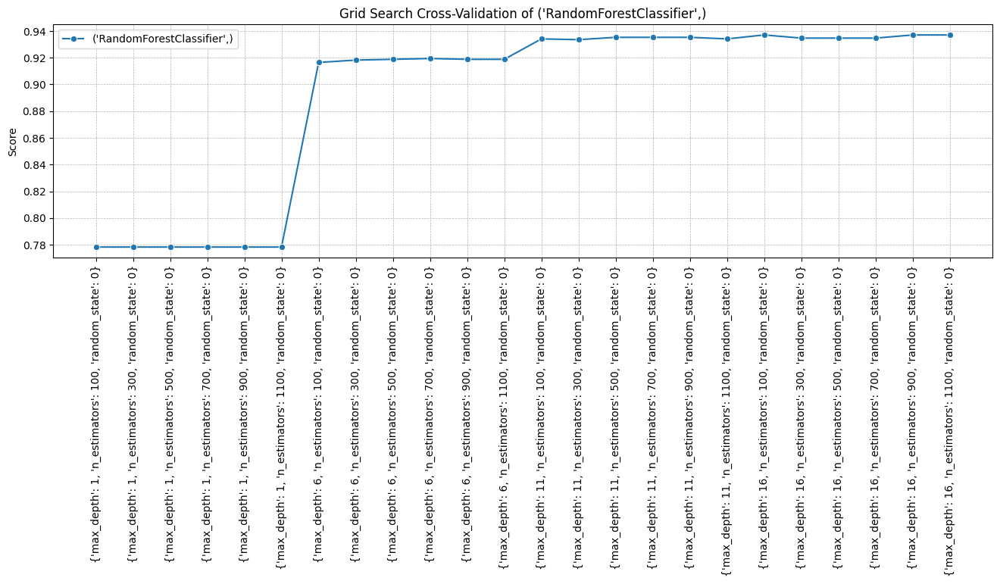

C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\neighbors\_classification.py", line 213, in fit
    self._validate_params()
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 600, in _validate_params

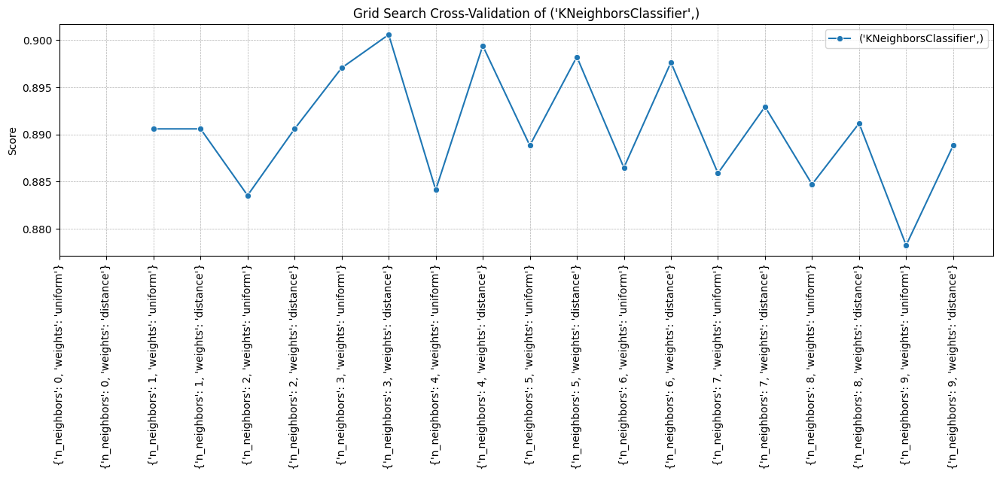

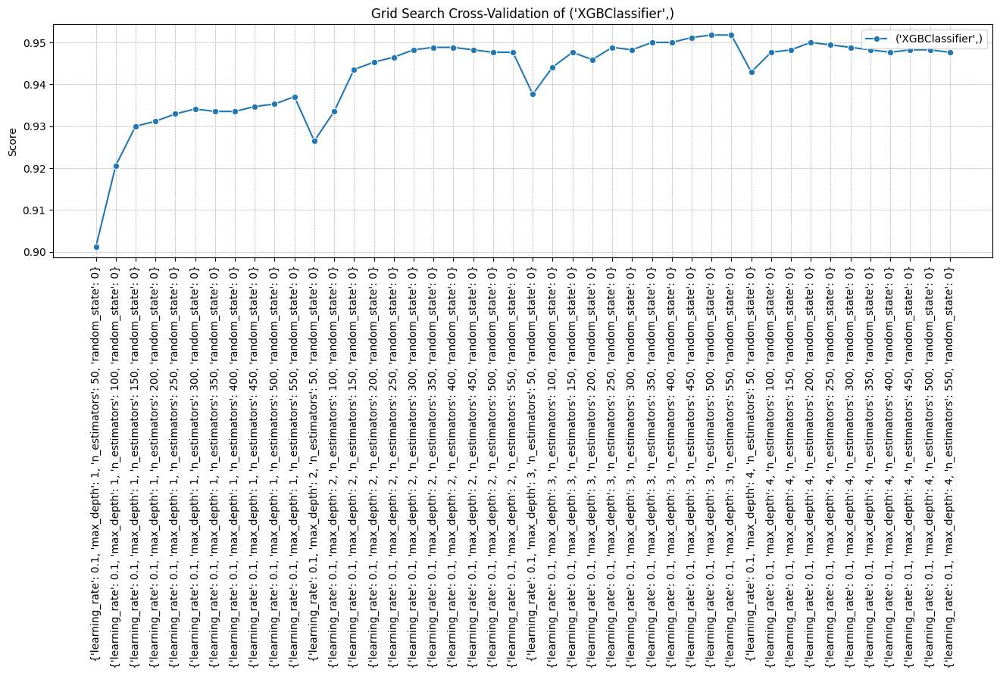

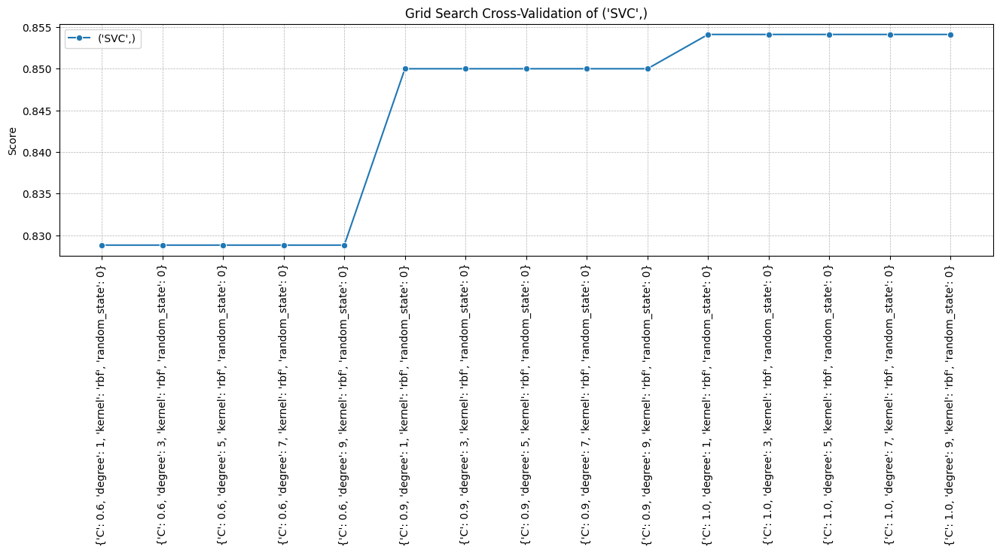


I migliori iper-parametri individuati del modello ('RandomForestClassifier',) sono: {'max_depth': 16, 'n_estimators': 100, 'random_state': 0}, con un best score di: 0.9370588235294118 


I migliori iper-parametri individuati del modello ('KNeighborsClassifier',) sono: {'n_neighbors': 3, 'weights': 'distance'}, con un best score di: 0.9005882352941177 


I migliori iper-parametri individuati del modello ('XGBClassifier',) sono: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'random_state': 0}, con un best score di: 0.951764705882353 


I migliori iper-parametri individuati del modello ('SVC',) sono: {'C': 1.0, 'degree': 1, 'kernel': 'rbf', 'random_state': 0}, con un best score di: 0.8541176470588235 



In [20]:
models = [RandomForestClassifier(), 
          KNeighborsClassifier(), 
          XGBClassifier(), 
          SVC()]

params_v1 = [{'n_estimators' : [i for i in range(100, 1300, 200)], 'max_depth' : [i for i in range(1, 20, 5)], 'random_state' : [rnd]},
          {'n_neighbors': [i for i in range(0,10,1)], 'weights': ['uniform', 'distance']},
          {'max_depth': range (1, 5, 1),'n_estimators': range(50, 600, 50),'learning_rate': [0.1], 'random_state' : [rnd]},
          {'C' : [0.60, 0.90, 1.00], 'kernel' : ['rbf'], 'random_state' : [rnd], 'degree' : [i for i in range(1 ,10 ,2)]}]

analisi_v1 = grid_search_cross_validation(models, params_v1, X_train_full_v1, y_train_full)

**OSSERVAZIONI**:
* RandomForestClassifier **score analisi_v0**: 0.9364, **score analisi_v1**: 0.9370
* KNeighborsClassifier **score analisi_v0**: 0.9005, **score analisi_v1**: 0.9005
* XGBClassifier **score analisi_v0**: 0.9541, **score analisi_v1**: 0.9517
* SVC **score analisi_v0**: 0.8494, **score analisi_v1**: 0.8541
* è migliorato in generale ma quasi a livello atomico

---
### 9. Scaliamo tutte le feature
Utilizziremo il il nuovo dataset v1 (quello con le colonne rimosse)

In [21]:
X_train_full_v2 = X_train_full_v1.copy()
X_test_v2 = X_test_v1.copy()

scaler = MinMaxScaler()
scaler.fit(pd.concat([X_train_full_v2, X_test_v2]))

MinMaxScaler()

In [22]:
X_train_full_v2_np = scaler.transform(X_train_full_v2)
X_test_v2_np = scaler.transform(X_test_v2)


X_train_full_v2 = pd.DataFrame(data = X_train_full_v2_np, columns = X_train_full_v1.columns)
X_test_v2 = pd.DataFrame(data = X_test_v2_np, columns = X_train_full_v1.columns)

In [23]:
#Anteprima delle prime 5 righe dei nuovi dataset scalati

display(X_train_full_v2.head(5))
display(X_test_v2.head(5))

,BASELINE_VALUE,ACCELERATIONS,FETAL_MOVEMENT,UTERINE_CONTRACTIONS,LIGHT_DECELERATIONS,ABNORMAL_SHORT_TERM_VARIABILITY,MEAN_VALUE_OF_SHORT_TERM_VARIABILITY,PERCENTAGE_OF_TIME_WITH_ABNORMAL_LONG_TERM_VARIABILITY,MEAN_VALUE_OF_LONG_TERM_VARIABILITY,HISTOGRAM_WIDTH,HISTOGRAM_MIN,HISTOGRAM_MAX,HISTOGRAM_NUMBER_OF_PEAKS,HISTOGRAM_MODE,HISTOGRAM_MEAN,HISTOGRAM_MEDIAN,HISTOGRAM_VARIANCE,HISTOGRAM_TENDENCY
0,0.351852,0.000000,0.002079,0.533333,0.733333,0.706667,0.132353,0.000000,0.108481,0.412429,0.128440,0.155172,0.277778,0.440945,0.348624,0.348624,0.033457,1.0
1,0.648148,0.315789,0.000000,0.400000,0.000000,0.613333,0.161765,0.000000,0.112426,0.423729,0.403670,0.431034,0.333333,0.645669,0.633028,0.642202,0.029740,0.5
2,0.796296,0.052632,0.000000,0.533333,0.000000,0.573333,0.044118,0.208791,0.126233,0.112994,0.889908,0.413793,0.111111,0.748031,0.752294,0.724771,0.000000,0.5
3,0.648148,0.473684,0.047817,0.000000,0.000000,0.453333,0.132353,0.021978,0.057199,0.627119,0.073394,0.431034,0.388889,0.740157,0.697248,0.688073,0.029740,1.0
4,0.722222,0.263158,0.000000,0.200000,0.000000,0.453333,0.088235,0.000000,0.165680,0.158192,0.825688,0.422414,0.111111,0.732283,0.724771,0.688073,0.011152,0.5


,BASELINE_VALUE,ACCELERATIONS,FETAL_MOVEMENT,UTERINE_CONTRACTIONS,LIGHT_DECELERATIONS,ABNORMAL_SHORT_TERM_VARIABILITY,MEAN_VALUE_OF_SHORT_TERM_VARIABILITY,PERCENTAGE_OF_TIME_WITH_ABNORMAL_LONG_TERM_VARIABILITY,MEAN_VALUE_OF_LONG_TERM_VARIABILITY,HISTOGRAM_WIDTH,HISTOGRAM_MIN,HISTOGRAM_MAX,HISTOGRAM_NUMBER_OF_PEAKS,HISTOGRAM_MODE,HISTOGRAM_MEAN,HISTOGRAM_MEDIAN,HISTOGRAM_VARIANCE,HISTOGRAM_TENDENCY
0,0.703704,0.000000,0.004158,0.066667,0.066667,0.880000,0.058824,0.252747,0.216963,0.694915,0.220183,0.672414,0.277778,0.677165,0.660550,0.642202,0.011152,0.5
1,0.462963,0.526316,0.000000,0.200000,0.066667,0.560000,0.176471,0.000000,0.065089,0.463277,0.311927,0.405172,0.388889,0.716535,0.642202,0.642202,0.074349,1.0
2,0.314815,0.105263,0.000000,0.333333,0.000000,0.346667,0.102941,0.153846,0.173570,0.203390,0.577982,0.258621,0.111111,0.519685,0.504587,0.467890,0.014870,0.5
3,0.574074,0.000000,0.033264,0.000000,0.000000,0.693333,0.044118,0.131868,0.214990,0.463277,0.165138,0.267241,0.111111,0.653543,0.633028,0.605505,0.011152,1.0
4,0.388889,0.000000,0.000000,0.400000,0.000000,0.160000,0.220588,0.000000,0.311637,0.497175,0.522936,0.655172,0.500000,0.590551,0.577982,0.559633,0.026022,0.0


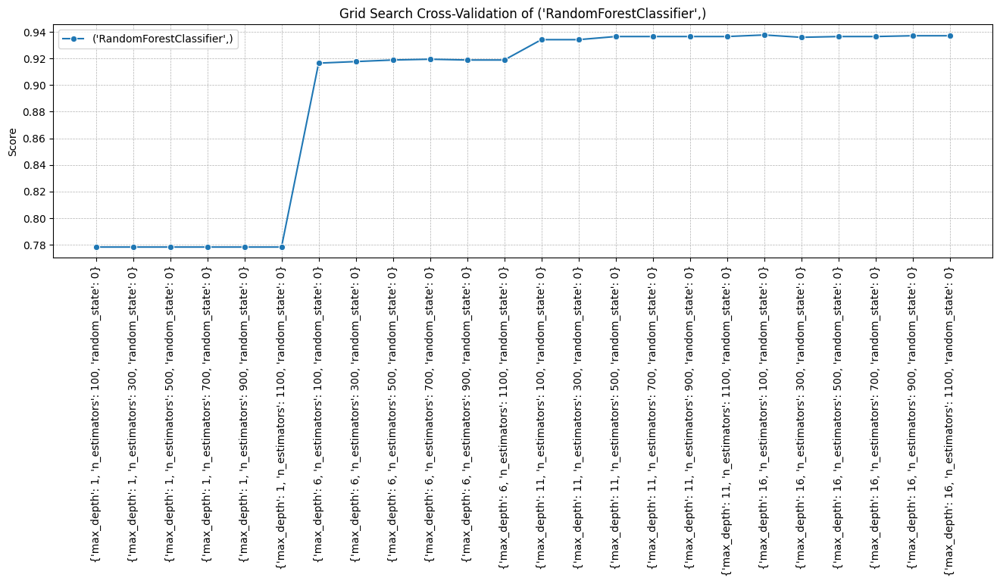

C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\neighbors\_classification.py", line 213, in fit
    self._validate_params()
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 600, in _validate_params

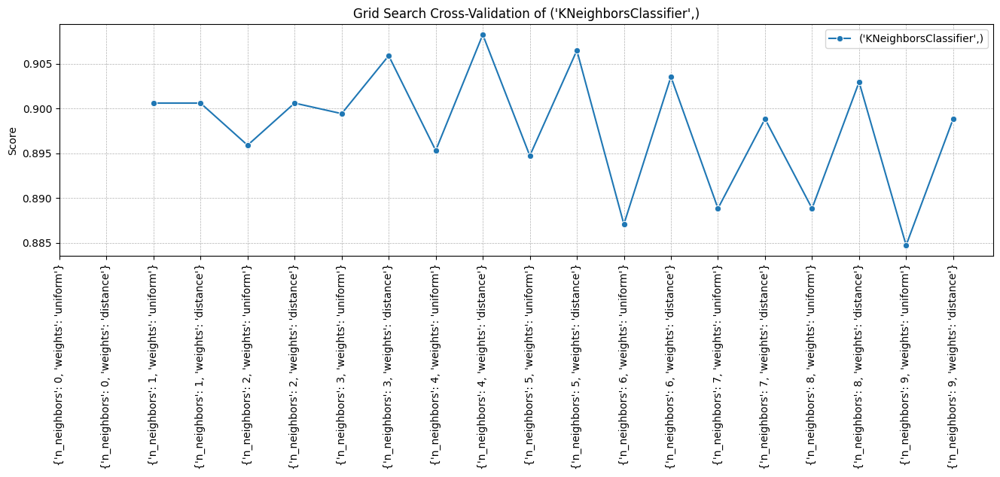

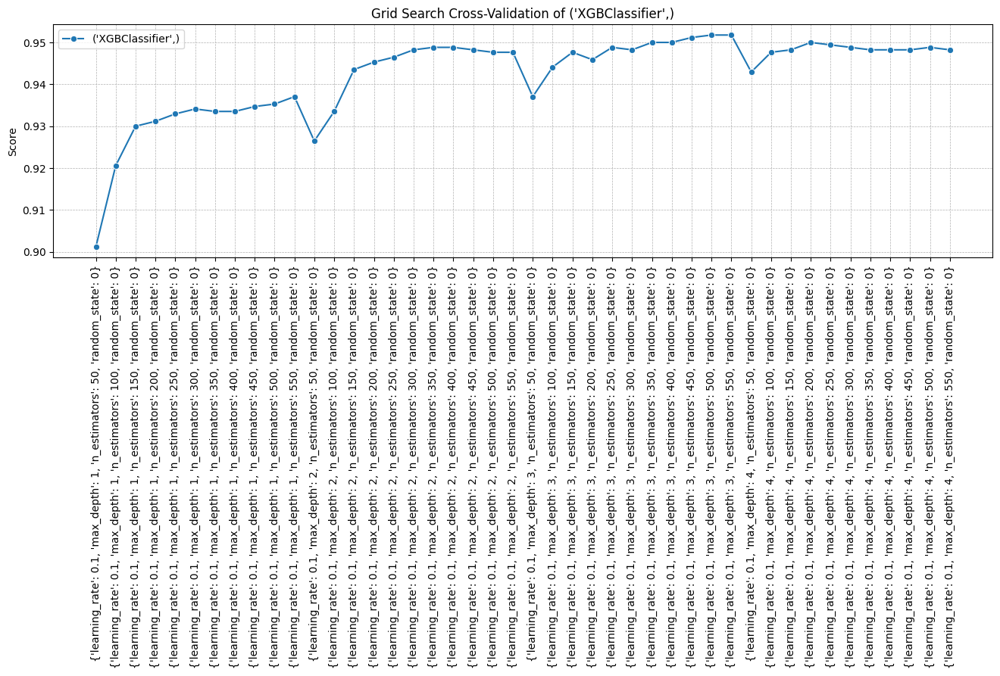

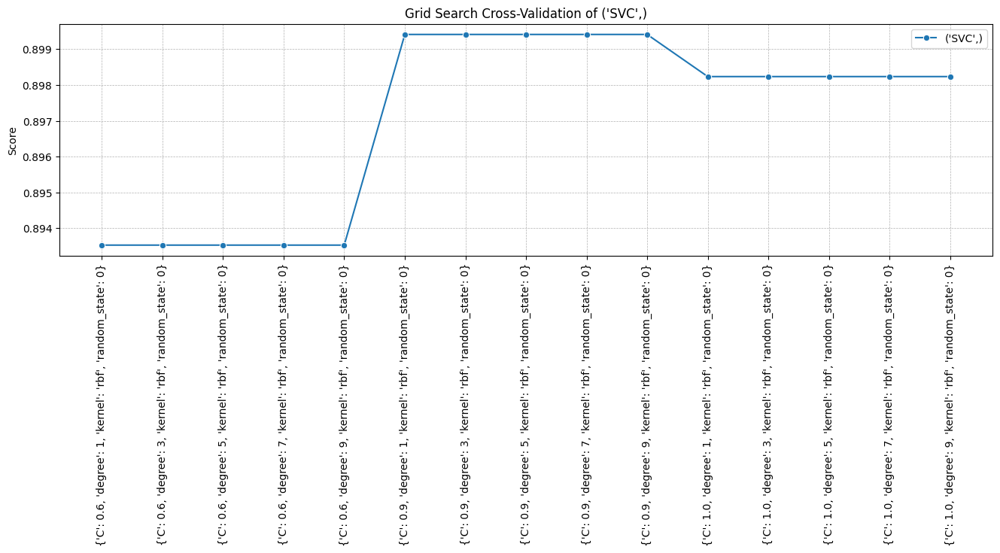


I migliori iper-parametri individuati del modello ('RandomForestClassifier',) sono: {'max_depth': 16, 'n_estimators': 100, 'random_state': 0}, con un best score di: 0.9376470588235295 


I migliori iper-parametri individuati del modello ('KNeighborsClassifier',) sono: {'n_neighbors': 4, 'weights': 'distance'}, con un best score di: 0.908235294117647 


I migliori iper-parametri individuati del modello ('XGBClassifier',) sono: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'random_state': 0}, con un best score di: 0.951764705882353 


I migliori iper-parametri individuati del modello ('SVC',) sono: {'C': 0.9, 'degree': 1, 'kernel': 'rbf', 'random_state': 0}, con un best score di: 0.8994117647058824 



In [24]:
models = [RandomForestClassifier(), 
          KNeighborsClassifier(), 
          XGBClassifier(), 
          SVC()]

params_v2 = [{'n_estimators' : [i for i in range(100, 1300, 200)], 'max_depth' : [i for i in range(1, 20, 5)], 'random_state' : [rnd]},
          {'n_neighbors': [i for i in range(0,10,1)], 'weights': ['uniform', 'distance']},
          {'max_depth': range (1, 5, 1),'n_estimators': range(50, 600, 50),'learning_rate': [0.1], 'random_state' : [rnd]},
          {'C' : [0.60, 0.90, 1.00], 'kernel' : ['rbf'], 'random_state' : [rnd], 'degree' : [i for i in range(1 ,10 ,2)]}]

analisi_v2 = grid_search_cross_validation(models, params_v2, X_train_full_v2, y_train_full)

**OSSERVAZIONI**:
* RandomForestClassifier **score analisi_v0**: 0.9364, **score analisi_v2**: 0.9376
* KNeighborsClassifier **score analisi_v0**: 0.9005   , **score analisi_v2**: 0.9082
* XGBClassifier **score analisi_v0**: 0.9541, **score analisi_v2**: 0.9517
* SVC **score analisi_v0**: 0.8494, **score analisi_v2**: 0.8994
* C'è stato un miglioramento generale soprattutto per SVC

		CLASSIFICATIION METRICS "RandomForestClassifier":

              precision    recall  f1-score   support

      Normal       0.97      0.98      0.98       332
     Suspect       0.86      0.86      0.86        59
Pathological       1.00      0.89      0.94        35

    accuracy                           0.96       426
   macro avg       0.94      0.91      0.93       426
weighted avg       0.96      0.96      0.96       426

		CLASSIFICATIION METRICS "KNeighborsClassifier":

              precision    recall  f1-score   support

      Normal       0.95      0.98      0.97       332
     Suspect       0.80      0.76      0.78        59
Pathological       1.00      0.77      0.87        35

    accuracy                           0.94       426
   macro avg       0.92      0.84      0.87       426
weighted avg       0.94      0.94      0.94       426

		CLASSIFICATIION METRICS "XGBClassifier":

              precision    recall  f1-score   support

      Normal       0.97      0.99  

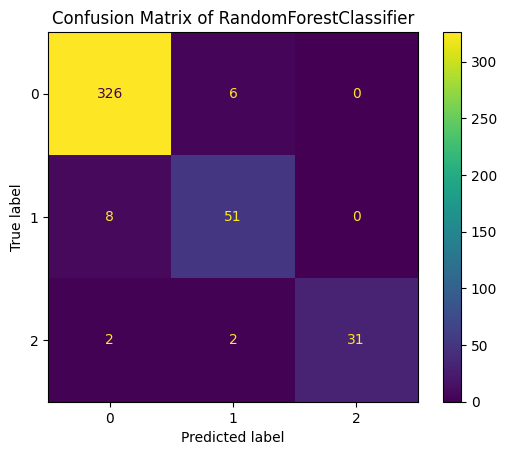

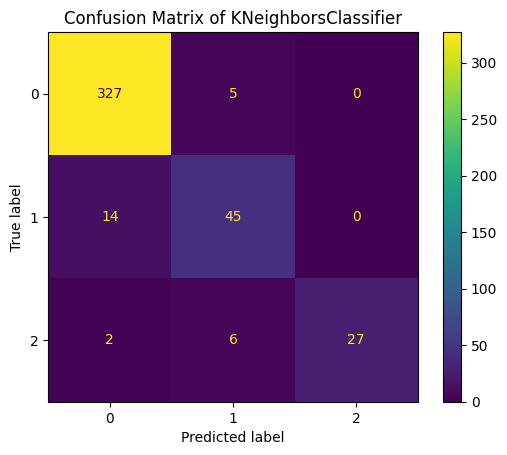

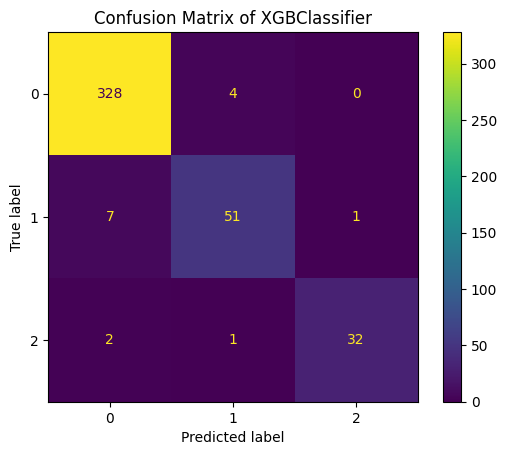

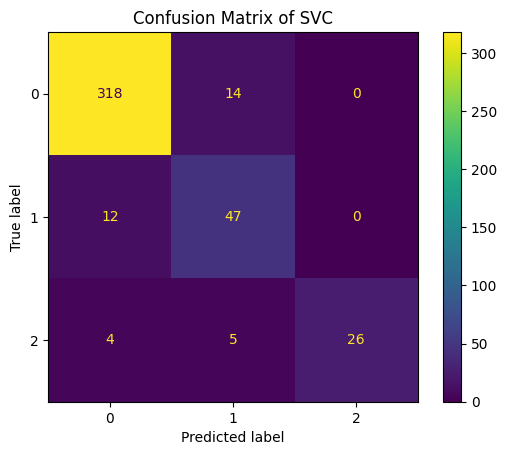

In [25]:
#Lista di modelli ottimizzati tramite l'analisi_v2
model_opt_v2 = [
    RandomForestClassifier(max_depth =  16, n_estimators =  100, random_state = rnd, n_jobs = -1),
    KNeighborsClassifier(n_neighbors = 4, weights = 'distance'),
    XGBClassifier(learning_rate = 0.1, max_depth = 3, n_estimators = 500, random_state = rnd, n_jobs = -1),
    SVC(C = 0.9, degree = 1, kernel = 'rbf', random_state = rnd)
]

#richiamo della funzione definita nel blocco di codice precedente
model_fitted_list_v2 = test_model(model_opt, X_train_full_v2, y_train_full, X_test_v2, y_test)

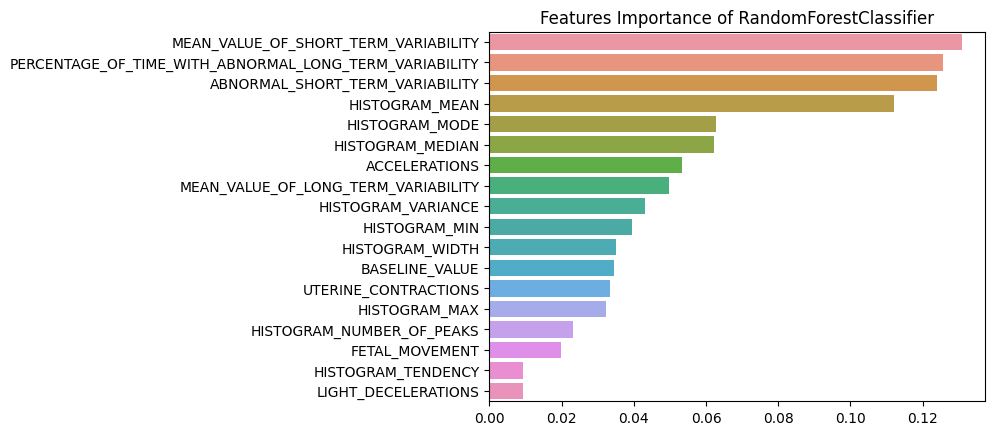

In [26]:
#ricavo i modelli fittati con gli iperparametri ottimizzati che contengono delle info sul features importance
model_fitted_list_v2[0].feature_importances_
#il [::-1] serve per girare l'array in modo tale che sia decrescente
sorted_idx = model_fitted_list_v2[0].feature_importances_.argsort()[::-1]

#Plotto un barplot veloce con sns 
sns.barplot(x = model_fitted_list_v2[0].feature_importances_[sorted_idx], y = X_train_full_v2.columns[sorted_idx])
plt.title('Features Importance of RandomForestClassifier')

first_8_fi_values = model_fitted_list_v2[0].feature_importances_[sorted_idx][:9]
first_8_fi = X_train_full_v2.columns[sorted_idx][:9]

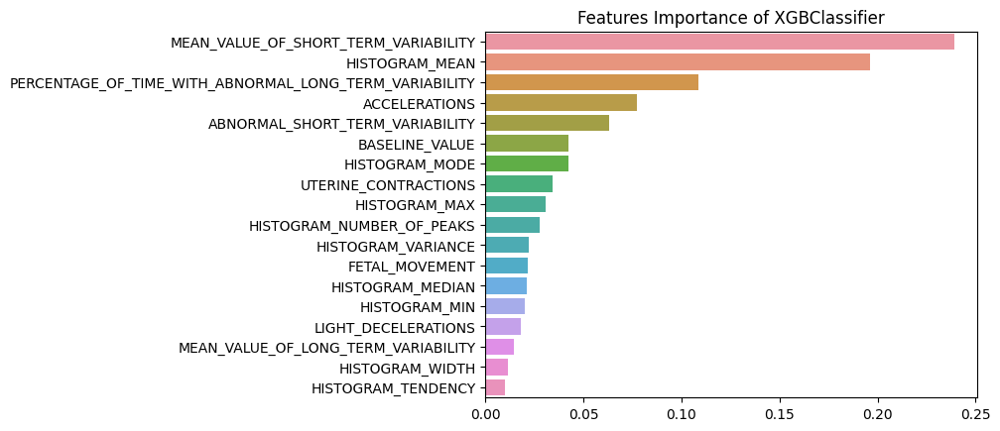

In [27]:
#ricavolo i modelli fittati con gli iperparametri ottimizzati che contengono delle info sul features importance
model_fitted_list_v2[2].feature_importances_
#il [::-1] serve per girare l'array in modo tale che sia decrescente
sorted_idx = model_fitted_list_v2[2].feature_importances_.argsort()[::-1]

#Plotto un barplot veloce con sns 
sns.barplot(x = model_fitted_list_v2[2].feature_importances_[sorted_idx], y = X_train_full_v2.columns[sorted_idx])
plt.title('Features Importance of XGBClassifier')

first_5_fi_values = model_fitted_list_v2[2].feature_importances_[sorted_idx][:9]
first_5_fi = X_train_full_v2.columns[sorted_idx][:9]

**OSSERVAZIONI**:
* RandomForestClassifier nel test ha trovato un'altro feto patologico 
* KNeighborsClassifier riesce a trovare meglio i feti sani ma è peggiorato nell'individuare i feti patologici
* XGBClassifier è migliorato leggermente nell'individuare i feti patologici
* SVC anche se ha delle prestazioni basse rispetto ai modelli precedenti è comunque migliorato notevolmente dal primo test
* C'è stato un miglioramento generale soprattutto per SVC
* Da notare le Features Importance di XGB e RandomForest

### 10. Rimuoviamo la colonna UTERINE_CONTRACTIONS e valutazione modelli

In [28]:
#Copio i train e i test in nuove variabili
#così da applicare questi cambiamenti solo a quest'ultime e non a quelle dei passaggi precedenti.

X_train_full_v3 = X_train_full_v2.copy()
X_test_v3 = X_test_v2.copy()

#rimozione delle colonne
for df in [X_train_full_v3, X_test_v3]:
    df.drop('UTERINE_CONTRACTIONS', axis = 1, inplace=True)

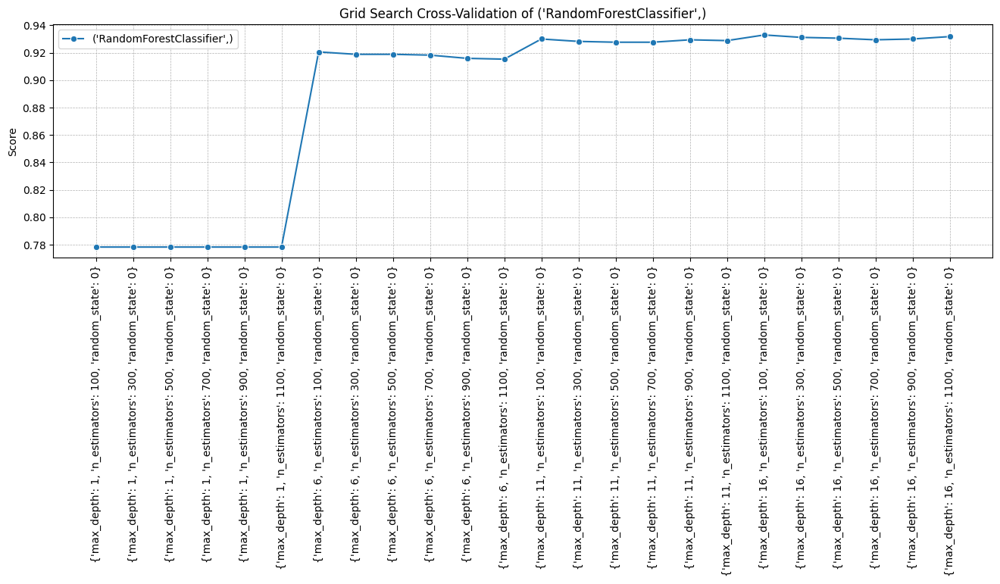

C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\neighbors\_classification.py", line 213, in fit
    self._validate_params()
  File "C:\Users\alexg\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 600, in _validate_params

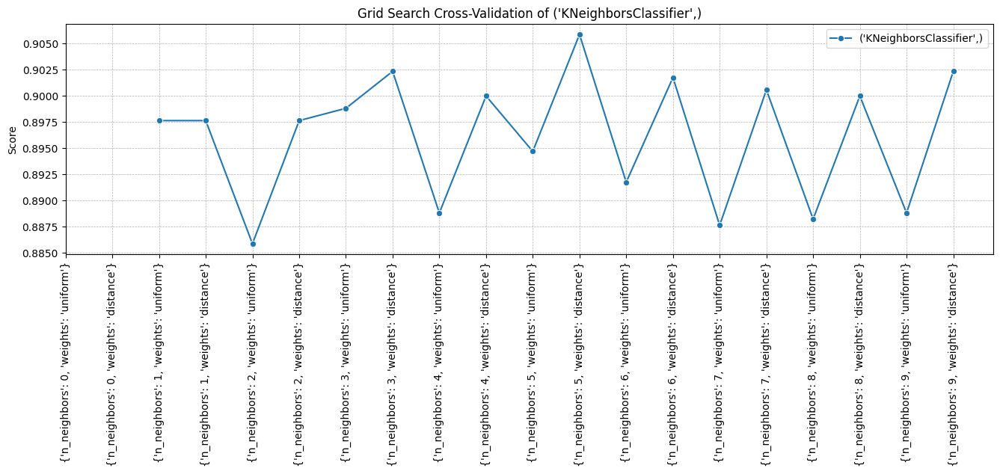

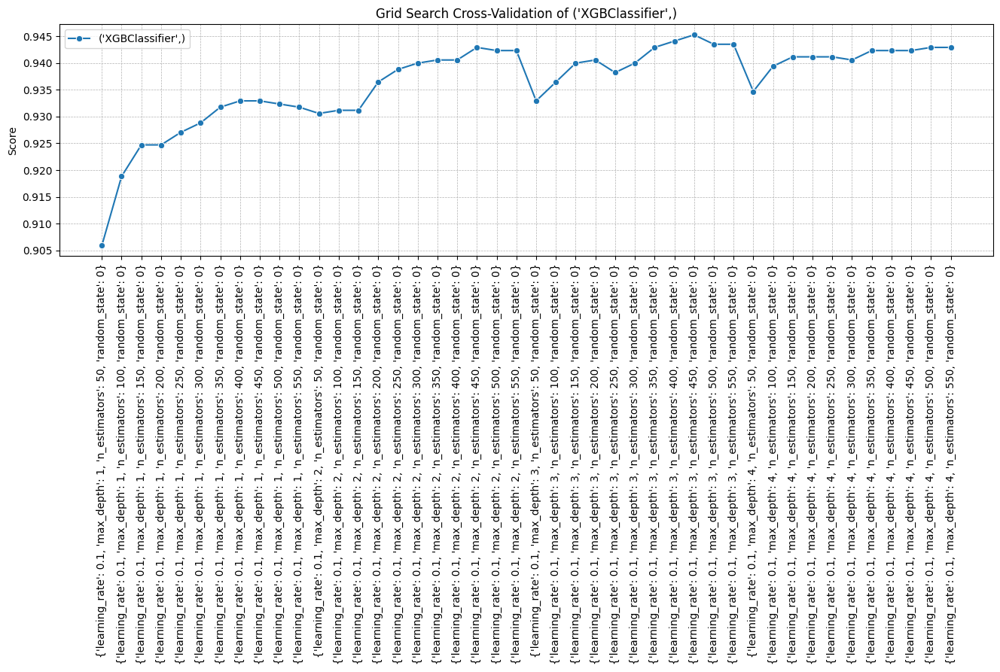

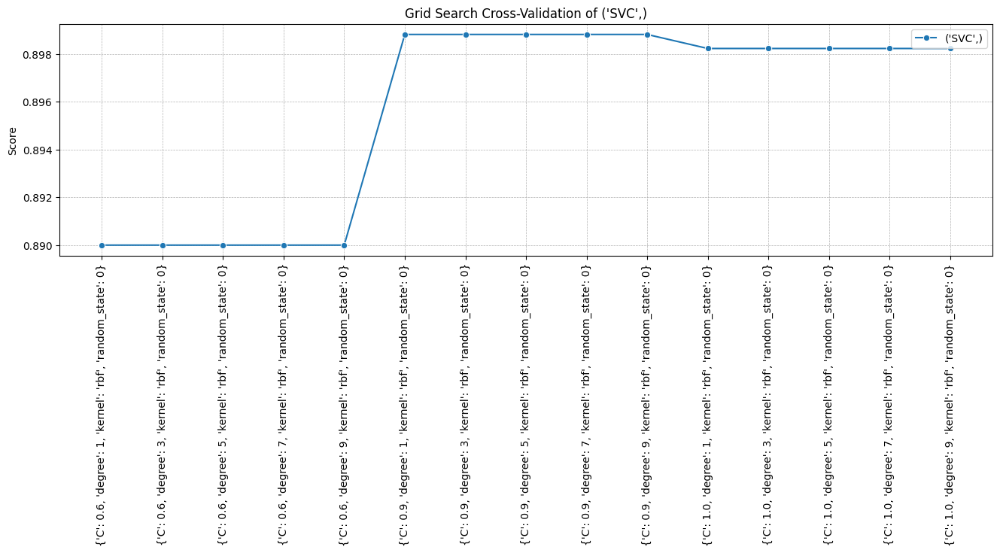


I migliori iper-parametri individuati del modello ('RandomForestClassifier',) sono: {'max_depth': 16, 'n_estimators': 100, 'random_state': 0}, con un best score di: 0.9329411764705883 


I migliori iper-parametri individuati del modello ('KNeighborsClassifier',) sono: {'n_neighbors': 5, 'weights': 'distance'}, con un best score di: 0.9058823529411765 


I migliori iper-parametri individuati del modello ('XGBClassifier',) sono: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 450, 'random_state': 0}, con un best score di: 0.9452941176470588 


I migliori iper-parametri individuati del modello ('SVC',) sono: {'C': 0.9, 'degree': 1, 'kernel': 'rbf', 'random_state': 0}, con un best score di: 0.8988235294117647 



In [29]:
models = [RandomForestClassifier(), 
          KNeighborsClassifier(), 
          XGBClassifier(), 
          SVC()]

params_v3 = [{'n_estimators' : [i for i in range(100, 1300, 200)], 'max_depth' : [i for i in range(1, 20, 5)], 'random_state' : [rnd]},
          {'n_neighbors': [i for i in range(0,10,1)], 'weights': ['uniform', 'distance']},
          {'max_depth': range (1, 5, 1),'n_estimators': range(50, 600, 50),'learning_rate': [0.1], 'random_state' : [rnd]},
          {'C' : [0.60, 0.90, 1.00], 'kernel' : ['rbf'], 'random_state' : [rnd], 'degree' : [i for i in range(1 ,10 ,2)]}]

analisi_v3 = grid_search_cross_validation(models, params_v3, X_train_full_v3, y_train_full)

**OSSERVAZIONI**:
* RandomForestClassifier **score analisi_v0**: 0.9364, **score analisi_v3**: 0.9329
* KNeighborsClassifier **score analisi_v0**: 0.9005   , **score analisi_v3**: 0.905
* XGBClassifier **score analisi_v0**: 0.9541, **score analisi_v3**: 0.9452
* SVC **score analisi_v0**: 0.8494, **score analisi_v3**: 0.8988
* C'è stato un peggioramento generale anche se leggero
* Quindi la feature UTERINE_CONTRACTIONS è rilevante per l'analisi e per predire meglio la salute del feto.

---
---
**OSSERVAZIONI FINALI**:

* Il dataset è stato pulito da delle colonne poco utili:
    * 'SEVERE_DECELERATIONS'
    * 'PROLONGUED_DECELERATIONS'
    * 'HISTOGRAM_NUMBER_OF_ZEROES'
* Le features sono state scalate tutte a valori compresi tra 0 e 1.
* Ne usciamo che il modello che ha meglio predetto il test è XGBClassifier.
* **XGBClassifier f1-score:**
    1. **Normal**       0.98
    2. **Suspect**    0.89
    3. **Pathological**      0.94